In [9]:
### IMPORTS ###
# %load_ext tensorboard
import inspect
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model
import tensorflow.keras.backend as K
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
import cat_VAE
from cat_VAE import VAE 

To see how the data was processed, look at idr_VAE-Copy2.ipynb

In [10]:
# Loading data to train on
data_dir = '/home/ctessier/tba/neural_nets/processed_NfkB_sequences.npy'
data = np.load(data_dir, allow_pickle=True)
tensor_data = tf.data.Dataset.from_tensor_slices(data)

In [11]:
# Metavariables
latent_dim = 2
input_shape = (504, 5)
batch_size = 64
epochs = 30
temperature = 0.2
learning_rate = 1e-2

vae = VAE(latent_dim, inputShape=input_shape, temperature=temperature)
#vae.run_eagerly=True
#print(vae.full_summary())

In [12]:
# train_data, test_data = train_test_split(data, test_size=0.1, random_state=42)
vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))

# Visualisation of the VAE model (use tensorboard --logdir logs in directory)
filename = "DatasetsBigEpoch"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs/" + filename)
saver = tf.keras.callbacks.ModelCheckpoint("saved_models/" + filename)

# With np array
#vae.fit(data, epochs=epochs, batch_size=batch_size, callbacks=[tensorboard_callback], workers=2, use_multiprocessing=True)

# With tf.data.Datsets
vae.fit(tensor_data.batch(batch_size), epochs=epochs, callbacks=[tensorboard_callback, saver], workers=2, use_multiprocessing=True)

Epoch 1/30
816/816 [==============================] - 20s 23ms/step - reconstruction_loss: 1863.1352 - kl_loss: 0.7410
Epoch 2/30
816/816 [==============================] - 18s 22ms/step - reconstruction_loss: 1823.4578 - kl_loss: 0.0222
Epoch 3/30
816/816 [==============================] - 18s 22ms/step - reconstruction_loss: 1703.0168 - kl_loss: 2.7639
Epoch 4/30
816/816 [==============================] - 18s 22ms/step - reconstruction_loss: 1653.5665 - kl_loss: 3.5129
Epoch 5/30
816/816 [==============================] - 18s 22ms/step - reconstruction_loss: 1649.4643 - kl_loss: 3.5900
Epoch 6/30
816/816 [==============================] - 18s 22ms/step - reconstruction_loss: 1648.8640 - kl_loss: 3.5507
Epoch 7/30
816/816 [==============================] - 18s 22ms/step - reconstruction_loss: 1648.1580 - kl_loss: 3.5203
Epoch 8/30
816/816 [==============================] - 18s 22ms/step - reconstruction_loss: 1648.5659 - kl_loss: 3.5231
Epoch 9/30
816/816 [============================

## Figures

processing grid 0, 0
processing grid 0, 1
processing grid 1, 0
processing grid 1, 1
plotting...


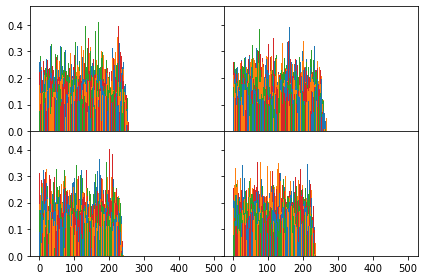

In [13]:
save_dir = "seq_avg"
load_dir = "/home/ctessier/tba/neural_nets/VAE_final/seq_avg.npy"
np.load(load_dir, allow_pickle=True)
#cat_VAE.plot_latent_peaks(1, model=vae, show_null=False, sample_size=20, save_dir=None)
cat_VAE.plot_latent_peaks(2, show_null=False, sample_size=1, load_dir=load_dir, fill=True)

In [16]:
def plot_label_clusters(vae, data, labels):
    # display a 2D plot of the digit classes in the latent space
    z_mean, _, _ = vae.encode(data)
    reduced_mean = TSNE(n_components=2).fit_transform(z_mean)
    plt.figure(figsize=(12, 10))
    plt.scatter(reduced_mean[:, 0], reduced_mean[:, 1], c=labels)
    plt.colorbar()
    plt.xlabel("TSNE[0]")
    plt.ylabel("TSNE[1]")
    plt.show()


def binarize_sequences(input_path, verbose=True):
    """Turns bases to binary values. This is necessary for categorical VAEs."""
    chrom_info = []
    sequences = []
    embeding_dict = {
            'C': [1., 0., 0., 0., 0.],
            'G': [0., 1., 0., 0., 0.],
            'A': [0., 0., 1., 0., 0.],
            'T': [0., 0., 0., 1., 0.],
            'N': [0., 0., 0., 0., 1.]
        }
    
    with open(input_path) as f:
        i = 1
        skip_count = 0
        
        #Iterate through sequences and sequence info and skip chrX and chrY
        for line in f.readlines():
            if skip_count != 0:
                skip_count -= 1
                continue 
                
            elif i % 2 == 1:
                #filter out clutter
                line = line.replace('>', '')
                line = line.replace('\n', '')
                
                #skip X and Y chromatin  
                if 'chr' not in line:
                    if verbose:
                        print('indexing is wrong?------------')

                elif 'chrX' in line or 'chrY' in line:
                    if verbose:
                        print('removed chromatin------------')
                    skip_count += 1
                    continue
                    
                else:
                    chrom_info.append(line.split(':'))
                    if verbose:
                        print('adding', chrom_info[-1][0])
                    
            else:
                sequences.append([embeding_dict[base_pair] for base_pair in line[:-1]])
            i += 1
            
    #make sure name and sequences have the same length
    seq_len, info_len = len(sequences), len(chrom_info)
    
    assert seq_len == info_len, "Each sequence needs to have a name and information. Found %s sequences and %s names" % (seq_len, info_len)
    
    
    return (chrom_info, sequences)


#Make chrom_info easier to use
def split_chrom_info(chrom_info):
    chrom_names = [chrom_info[i][0] for i in range(len(chrom_info))]
    chrom_num = [int(chrom_name.replace('chr', '')) for chrom_name in chrom_names]
    
    seq_starts = [chrom_info[i][1].split('-')[0] for i in range(len(chrom_info))]
    seq_ends = [chrom_info[i][1].split('-')[1] for i in range(len(chrom_info))]
    
    return (chrom_names, chrom_num, (seq_starts, seq_ends))

Generating chromatin information...
Parsing chrom information...
plotting TSNE...


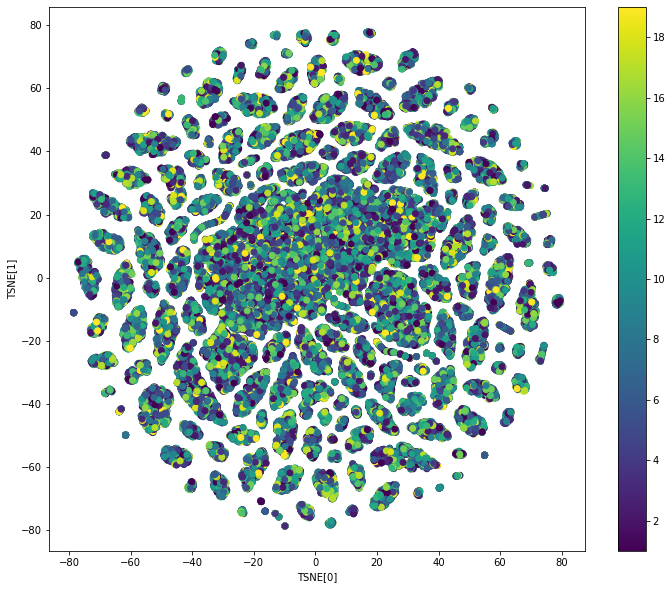

In [17]:
import matplotlib.pyplot as plt

print("Generating chromatin information...")
chrom_path = '/home/ctessier/tba/neural_nets/NfkB_sequences.txt'
chrom_info, _ = binarize_sequences(chrom_path, verbose=False)
print("Parsing chrom information...")
_, chrom_num, _ = split_chrom_info(chrom_info)
print("plotting TSNE...")
plot_label_clusters(vae, data, chrom_num)